In [97]:
import scanpy as scp
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os
from datetime import datetime
from auxiliar import *

# Select dataset

In [98]:
dataset = ("data_processed","wildtype")
# dataset = ("data_processed","T_mutant")
# dataset = ("data_processed","Eomes_mutant")

In [99]:
dataset_name = f"{dataset[1]}"

In [100]:
adatas = []
for file in np.sort([os.path.join(dataset[0],i) for i in os.listdir(dataset[0]) if dataset[1] in i and "rep" in i]):
    adata = scp.read_h5ad(file)
    adata.obs["sample"] = file.split(".")[0].split("_rep")[-1]
    adatas.append(adata.copy())

adata = scp.concat(adatas)
adata.var = adatas[0].var.loc[:,["gene_id","gene_name","gene_type"]]
adata.var_names = adatas[0].var_names
adata.obs["sample"] = adata.obs["sample"].astype("category")
adata.X = adata.layers["counts"].copy()

/Users/gatocor/miniforge3/envs/scrnaseq_vitamin_a/lib/python3.13/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [101]:
parameters = pd.read_csv("parameters_by_condition.csv", index_col=0).loc[dataset_name, :].to_dict()
print("Parameters: ")
parameters

Parameters: 


{'n_top_genes': 2000,
 'n_top_genes.1': 2000,
 'n_pcs': 30,
 'n_neighbors': 15,
 'cell_cycle_regression': True,
 'resolutions': '[0.1,0.2,0.5,1]'}

In [102]:
if not os.path.exists(f"figures/{dataset_name}"):
    os.makedirs(f"figures/{dataset_name}")

if not os.path.exists(f"tables/{dataset_name}"):
    os.makedirs(f"tables/{dataset_name}")

if not os.path.exists('script_versions'):
    os.makedirs('script_versions')

# QC

Text(0.5, 1.0, 'Percentage of mitochondrial genes')

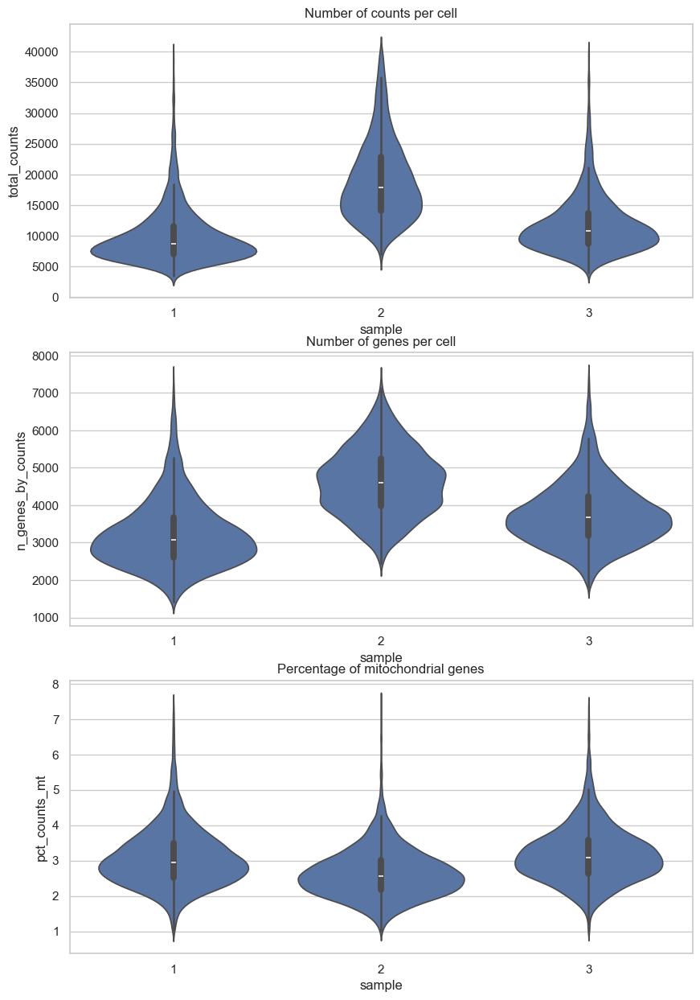

In [103]:
fig, ax = plt.subplots(3,1, figsize=(10,15))

sns.violinplot(data=adata.obs, x="sample", y="total_counts", ax=ax[0])
ax[0].set_title("Number of counts per cell")

sns.violinplot(data=adata.obs, x="sample", y="n_genes_by_counts", ax=ax[1])
ax[1].set_title("Number of genes per cell")

sns.violinplot(data=adata.obs, x="sample", y="pct_counts_mt", ax=ax[2])
ax[2].set_title("Percentage of mitochondrial genes")

# Normalization

In [104]:
scp.pp.normalize_total(adata)
scp.pp.log1p(adata)

# Dimensionality reduction

## Feature selection

In [105]:
scp.pp.highly_variable_genes(adata, n_top_genes=parameters["n_top_genes"])

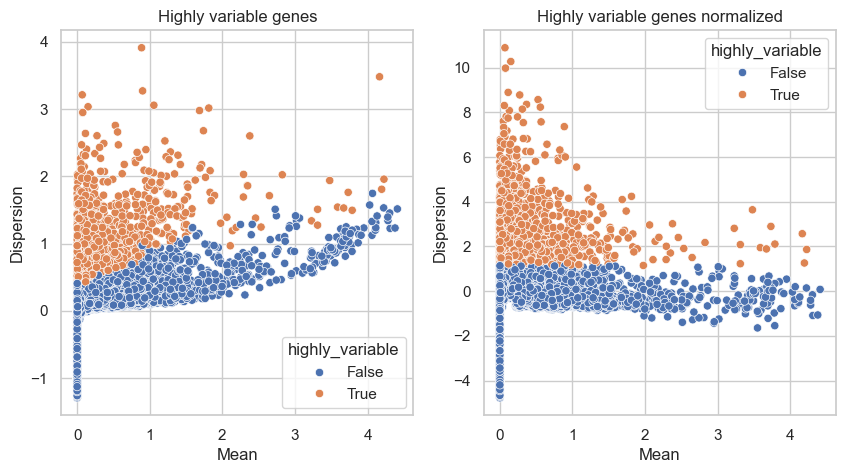

In [106]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.scatterplot(x="means", y="dispersions", hue="highly_variable", data=adata.var, ax=ax[0])
ax[0].set_title("Highly variable genes")
ax[0].set_xlabel("Mean")
ax[0].set_ylabel("Dispersion")

sns.scatterplot(x="means", y="dispersions_norm", hue="highly_variable", data=adata.var, ax=ax[1])
ax[1].set_title("Highly variable genes normalized")
ax[1].set_xlabel("Mean")
ax[1].set_ylabel("Dispersion")

fig.savefig(f"figures/{dataset_name}/highly_variable_genes.png", bbox_inches="tight", transparent=True, dpi=300)

## PCA

In [107]:
scp.pp.pca(adata, n_comps=100, use_highly_variable=True)

/Users/gatocor/miniforge3/envs/scrnaseq_vitamin_a/lib/python3.13/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


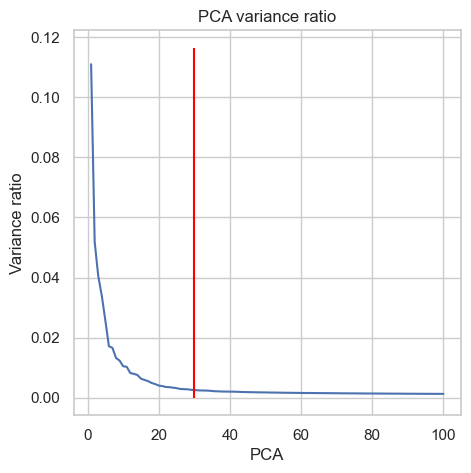

In [108]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

sns.lineplot(x=range(1, 101), y=adata.uns["pca"]["variance_ratio"], ax=ax)
ax.vlines(parameters["n_pcs"], 0, ax.get_ylim()[1], color="red", label="min")
ax.set_title("PCA variance ratio")
ax.set_xlabel("PCA")
ax.set_ylabel("Variance ratio")

fig.savefig(f"figures/{dataset_name}/pca_variance_ratio.png", bbox_inches="tight", transparent=True, dpi=300)

In [109]:
scp.pp.pca(adata, n_comps=parameters["n_pcs"], use_highly_variable=True)

/Users/gatocor/miniforge3/envs/scrnaseq_vitamin_a/lib/python3.13/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


## UMAP

In [110]:
scp.pp.neighbors(adata, use_rep="X_pca", key_added="neighbors_pca", n_neighbors=parameters["n_neighbors"], n_pcs=parameters["n_pcs"])
scp.tl.umap(adata, neighbors_key="neighbors_pca")
adata.obsm["X_umap_pca"] = adata.obsm["X_umap"]

# Corrections

## Batch correction

In [111]:
scp.external.pp.harmony_integrate(adata, key="sample", basis="X_pca", adjusted_basis="X_pca_sample")

2025-03-19 11:25:58,579 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-19 11:26:00,787 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-19 11:26:00,839 - harmonypy - INFO - Iteration 1 of 10
2025-03-19 11:26:02,673 - harmonypy - INFO - Iteration 2 of 10
2025-03-19 11:26:05,312 - harmonypy - INFO - Iteration 3 of 10
2025-03-19 11:26:08,297 - harmonypy - INFO - Iteration 4 of 10
2025-03-19 11:26:10,488 - harmonypy - INFO - Iteration 5 of 10
2025-03-19 11:26:13,449 - harmonypy - INFO - Converged after 5 iterations


In [112]:
scp.pp.neighbors(adata, use_rep="X_pca_sample", key_added="neighbors_pca_sample", n_neighbors=parameters["n_neighbors"], n_pcs=parameters["n_pcs"])
scp.tl.umap(adata, neighbors_key="neighbors_pca_sample")
adata.obsm["X_umap_pca_sample"] = adata.obsm["X_umap"]

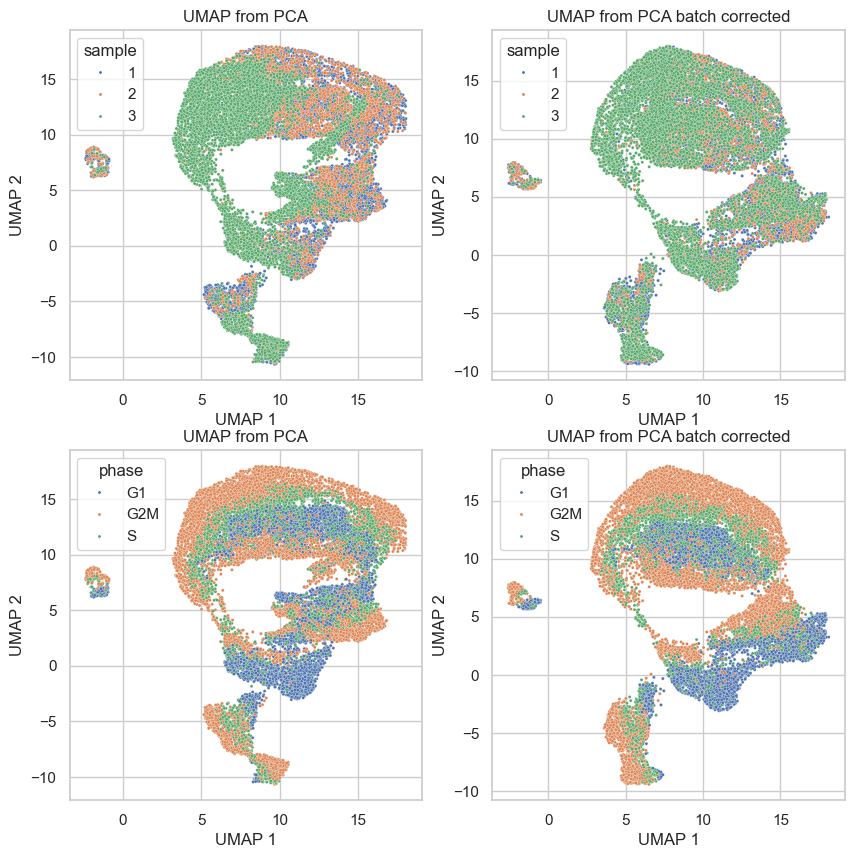

In [113]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

X = adata.obsm["X_umap_pca"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["sample"], s=5, ax=ax[0,0])
ax[0,0].set_title("UMAP from PCA")
ax[0,0].set_xlabel("UMAP 1")
ax[0,0].set_ylabel("UMAP 2")

X = adata.obsm["X_umap_pca_sample"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["sample"], s=5, ax=ax[0,1])
ax[0,1].set_title("UMAP from PCA batch corrected")
ax[0,1].set_xlabel("UMAP 1")
ax[0,1].set_ylabel("UMAP 2")

X = adata.obsm["X_umap_pca"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["phase"], s=5, ax=ax[1,0])
ax[1,0].set_title("UMAP from PCA")
ax[1,0].set_xlabel("UMAP 1")
ax[1,0].set_ylabel("UMAP 2")

X = adata.obsm["X_umap_pca_sample"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["phase"], s=5, ax=ax[1,1])
ax[1,1].set_title("UMAP from PCA batch corrected")
ax[1,1].set_xlabel("UMAP 1")
ax[1,1].set_ylabel("UMAP 2")

fig.savefig(f"figures/{dataset_name}/umap_pca_vs_pca_sample.png", bbox_inches="tight", transparent=True, dpi=300)

## Cell cycle correction

In [114]:
s_genes = [i for i in pd.read_csv("cell_cycle_G1_S.txt",header=None).values.flatten() if i in adata.var_names]
g2m_genes = [i for i in pd.read_csv("cell_cycle_G2_M.txt",header=None).values.flatten() if i in adata.var_names]

cycle_genes = s_genes+g2m_genes

In [115]:
scp.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

scp.external.pp.harmony_integrate(adata, "phase", basis="X_pca_sample", adjusted_basis="X_pca_sample_phase")

2025-03-19 11:26:24,354 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-19 11:26:25,041 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-19 11:26:25,066 - harmonypy - INFO - Iteration 1 of 10
2025-03-19 11:26:26,249 - harmonypy - INFO - Iteration 2 of 10
2025-03-19 11:26:27,388 - harmonypy - INFO - Iteration 3 of 10
2025-03-19 11:26:28,630 - harmonypy - INFO - Converged after 3 iterations


In [116]:
scp.pp.neighbors(adata, use_rep="X_pca_sample_phase", key_added="neighbors_pca_sample_phase", n_neighbors=parameters["n_neighbors"], n_pcs=parameters["n_pcs"])
scp.tl.umap(adata, neighbors_key="neighbors_pca_sample_phase")
adata.obsm["X_umap_pca_sample_phase"] = adata.obsm["X_umap"]

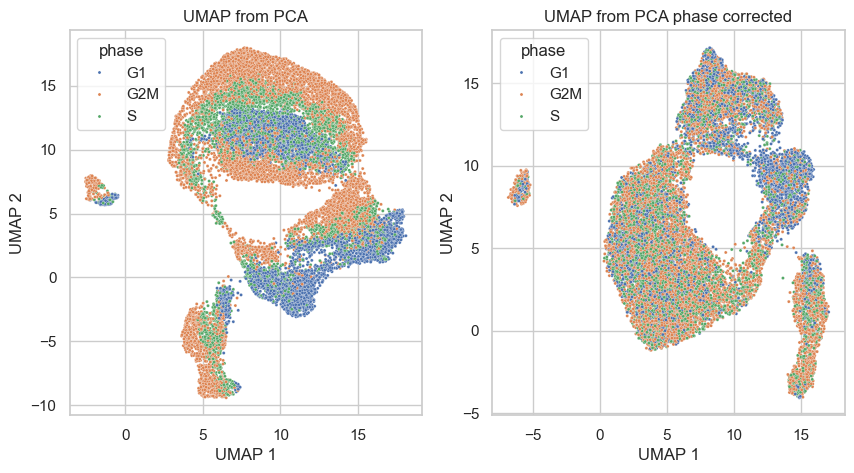

In [117]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

X = adata.obsm["X_umap_pca_sample"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["phase"], s=5, ax=ax[0])
ax[0].set_title("UMAP from PCA")
ax[0].set_xlabel("UMAP 1")
ax[0].set_ylabel("UMAP 2")

X = adata.obsm["X_umap_pca_sample_phase"]
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs["phase"], s=5, ax=ax[1])
ax[1].set_title("UMAP from PCA phase corrected")
ax[1].set_xlabel("UMAP 1")
ax[1].set_ylabel("UMAP 2")

fig.savefig(f"figures/{dataset_name}/umap_pca_vs_pca_phase.png", bbox_inches="tight", transparent=True, dpi=300)

In [118]:
if parameters["cell_cycle_regression"]:
    repr = "pca_sample_phase"
else:
    repr = "pca_sample"

# Clustering

In [119]:
parameters["resolutions"] = eval(parameters["resolutions"])

In [120]:
for resolution in parameters["resolutions"]:
    scp.tl.leiden(adata, neighbors_key=f"neighbors_{repr}", resolution=resolution, key_added=f"leiden_{resolution}")

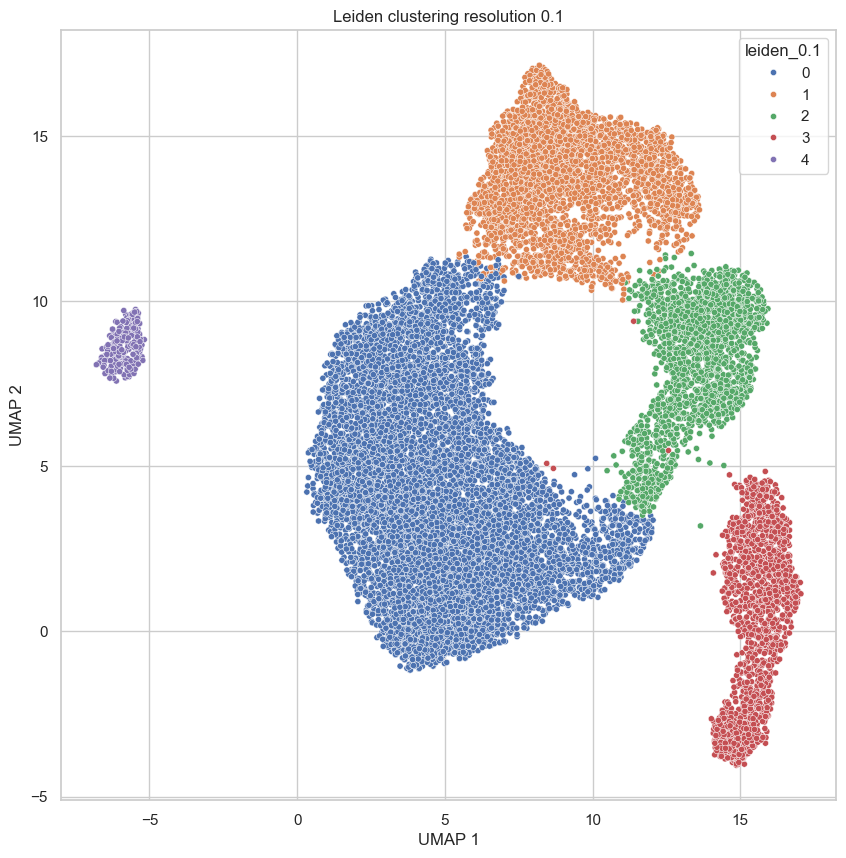

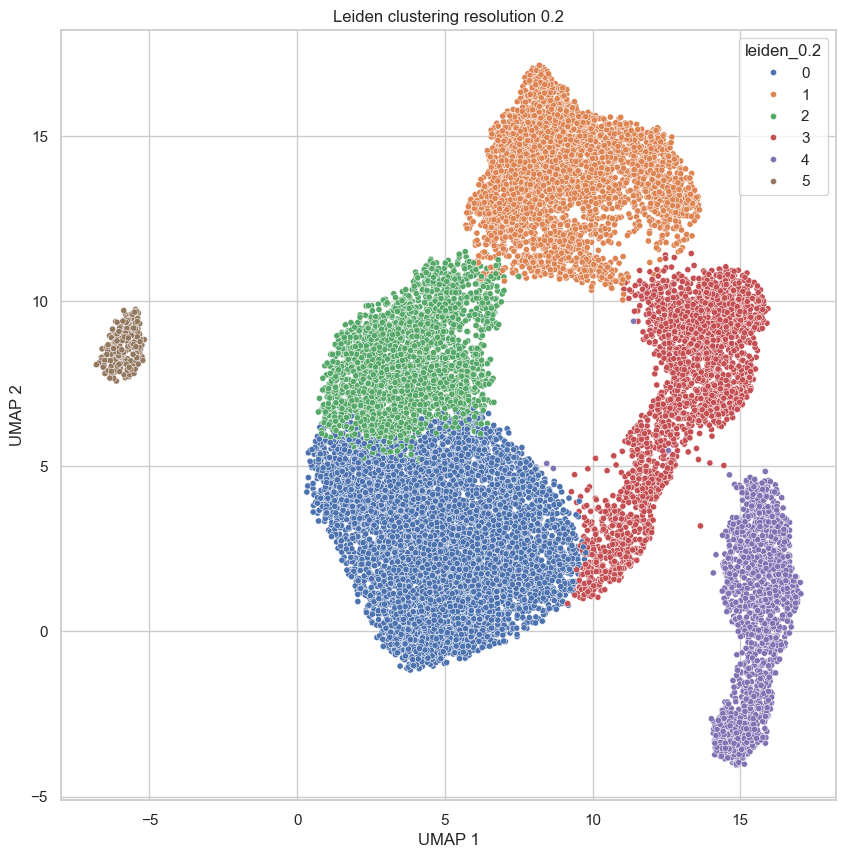

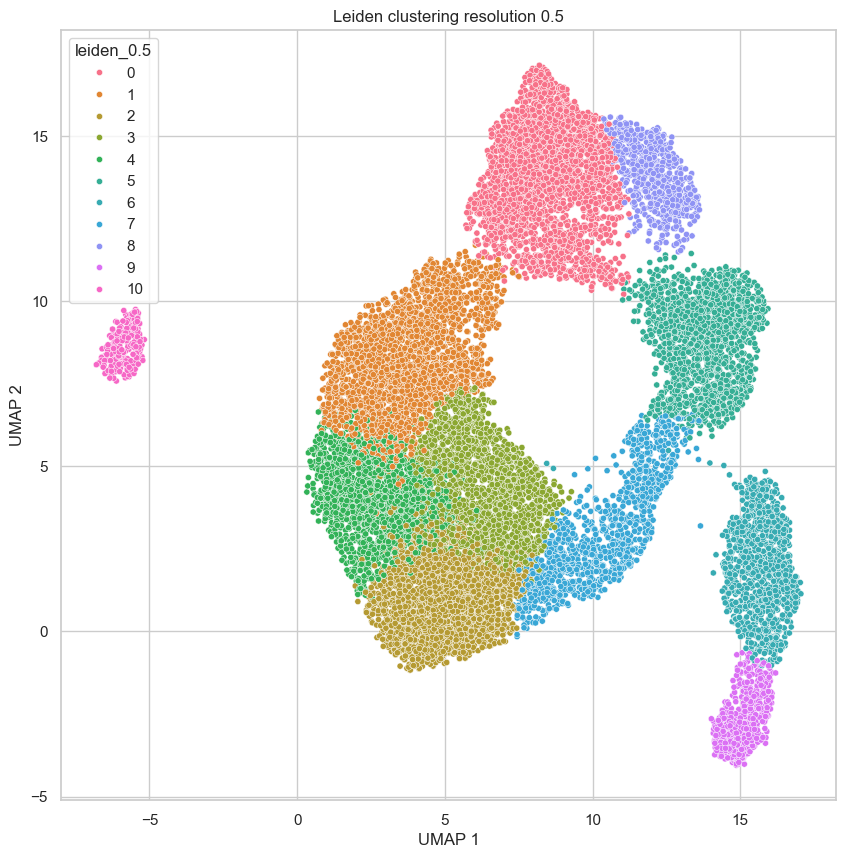

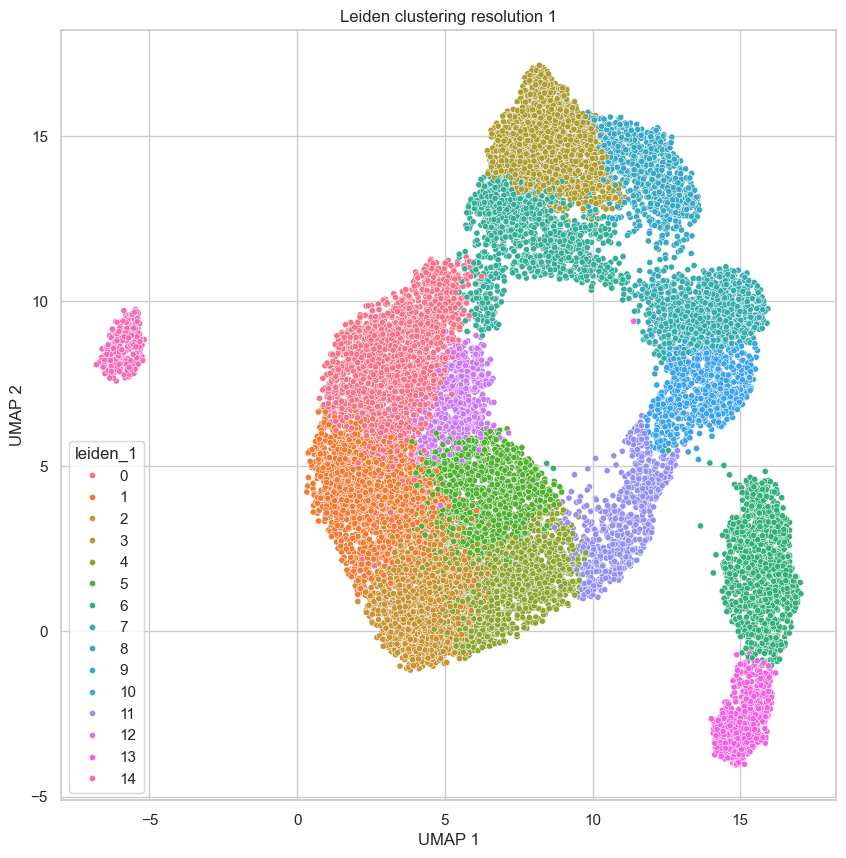

In [121]:
for resolution in parameters["resolutions"]:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    X = adata.obsm[f"X_umap_{repr}"]
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=adata.obs[f"leiden_{resolution}"], s=20, ax=ax)
    ax.set_title(f"Leiden clustering resolution {resolution}")
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")

    fig.savefig(f"figures/{dataset_name}/leiden_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)

# Markers

## Dotplot

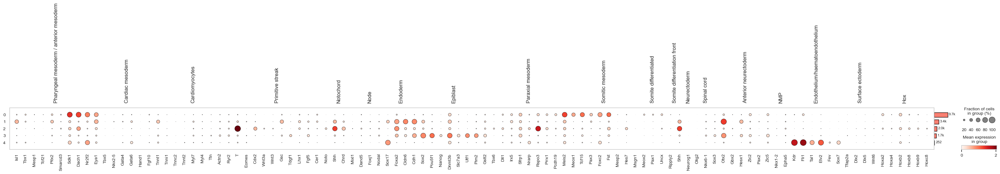

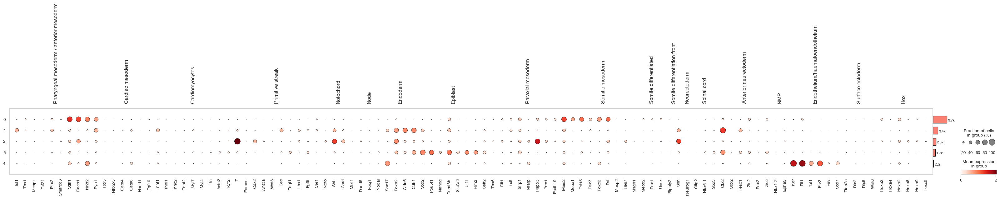

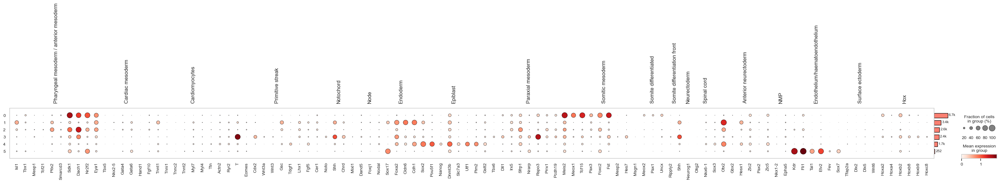

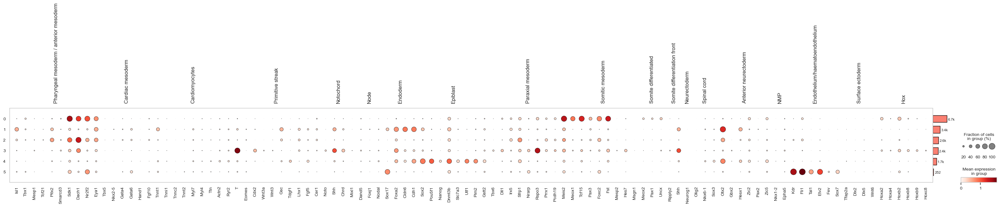

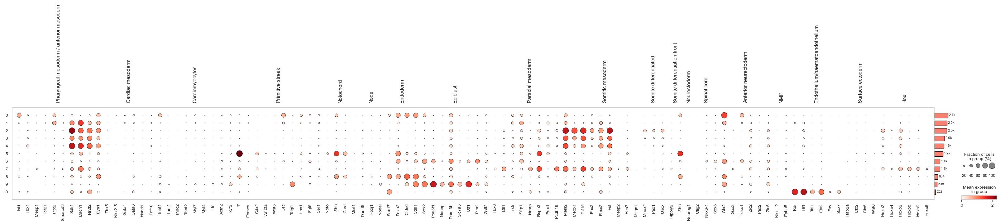

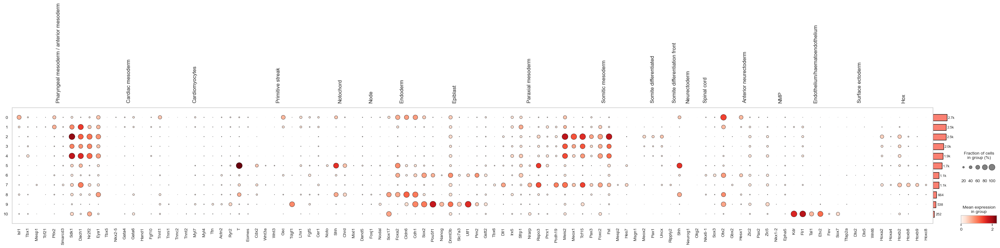

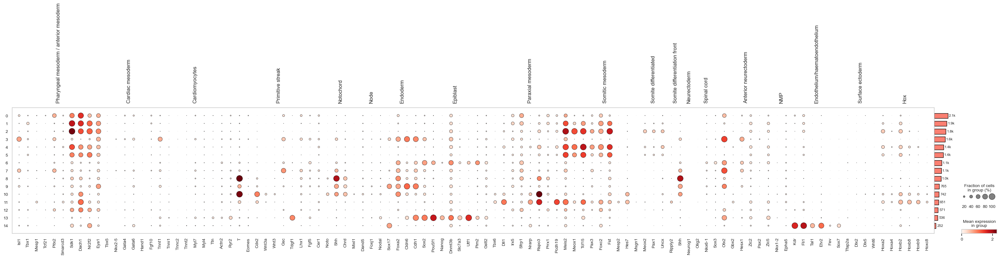

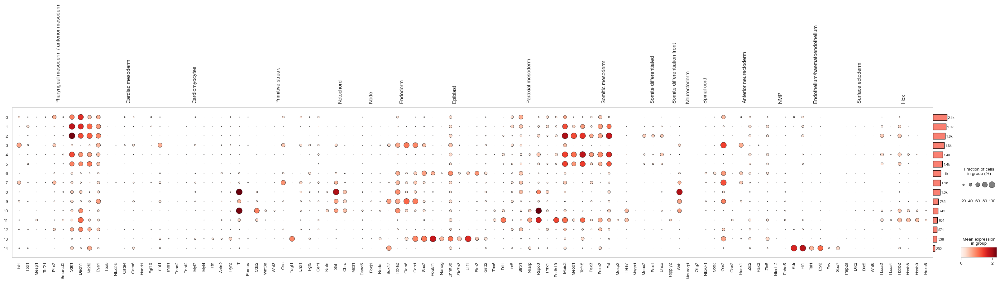

In [122]:
genes = {}
d = pd.read_csv("annotations.csv", header=None, sep=";")
for i in range(d.shape[0]):
    n = d.iloc[i,0]
    g = d.iloc[i,1]
    genes[n] = [j for j in (g.replace(" ","").replace("\t","").split(","))]

for resolution in parameters["resolutions"]:
    dp = scp.pl.dotplot(adata,var_names=genes,groupby=f"leiden_{resolution}", return_fig=True)
    dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

    dp.savefig(f"figures/{dataset_name}/markers_dotplot_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)

## Heatmap rescaled

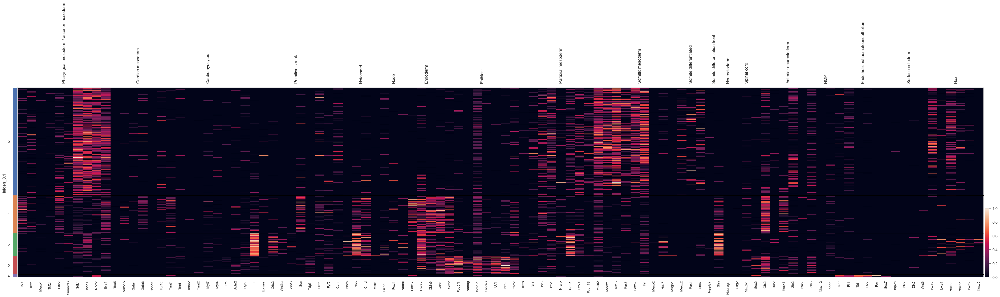

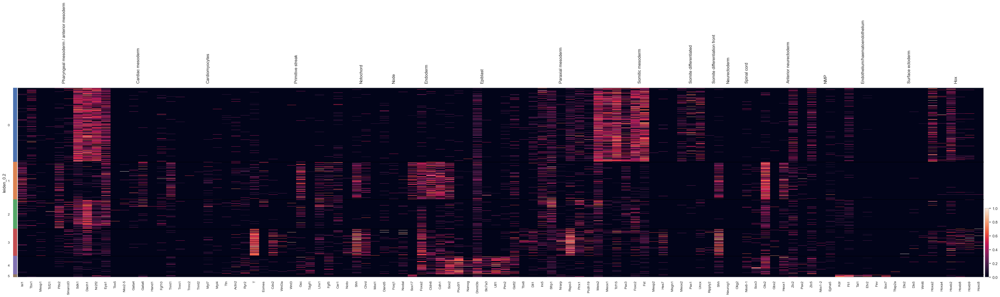

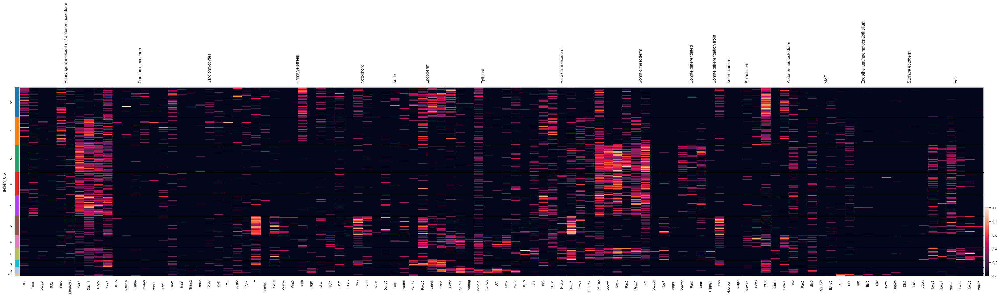

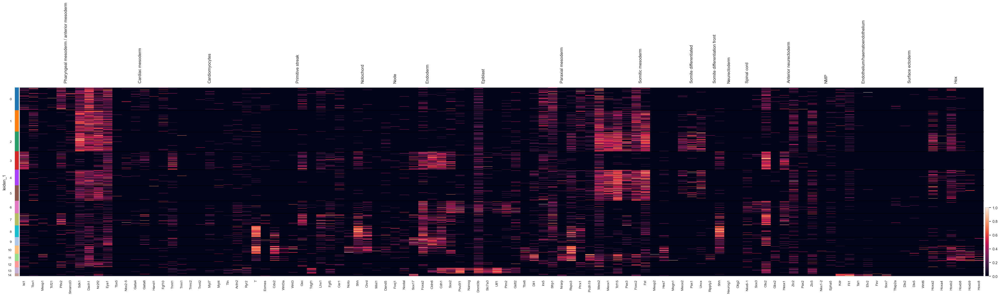

In [123]:
genes = {}
d = pd.read_csv("annotations.csv", header=None, sep=";")
for i in range(d.shape[0]):
    n = d.iloc[i,0]
    g = d.iloc[i,1]
    genes[n] = [j for j in (g.replace(" ","").replace("\t","").split(","))]

for resolution in parameters["resolutions"]:
    
    fig, dp = heatmap(adata,var_names=genes,groupby=f"leiden_{resolution}", standard_scale="var", figsize=(50,10), show_gene_labels=True, show=False)

    fig.savefig(f"figures/{dataset_name}/markers_heatmap_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)

# Differential expression

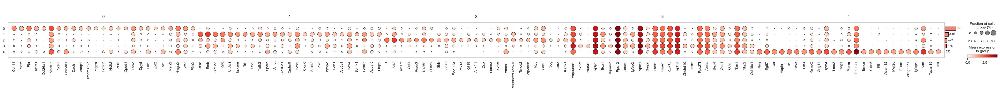

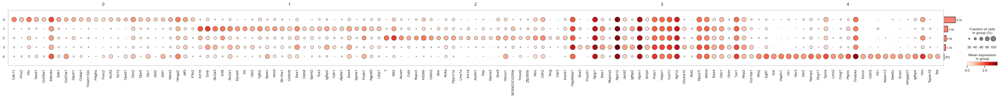

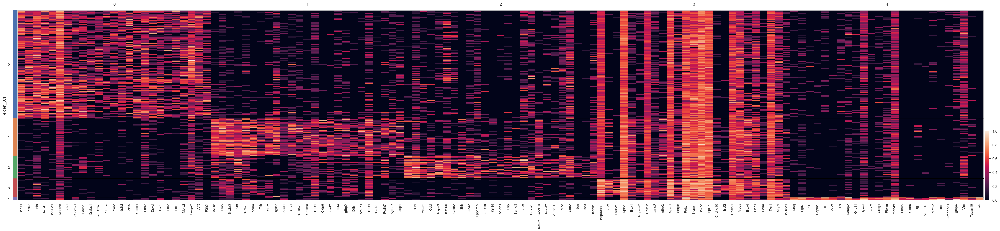

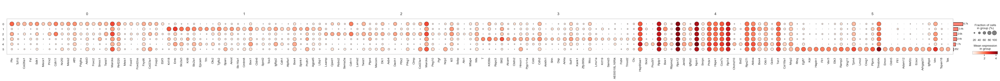

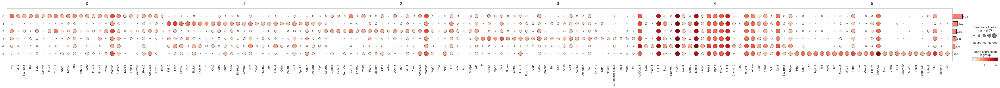

...

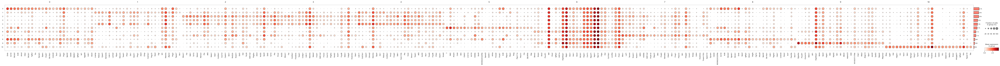

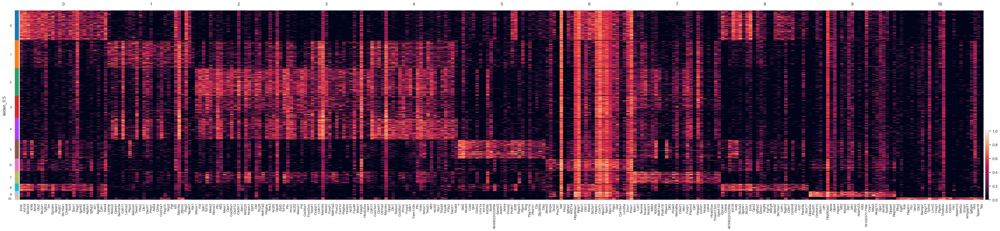

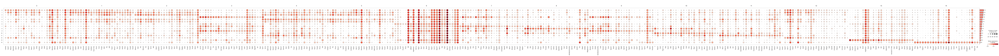

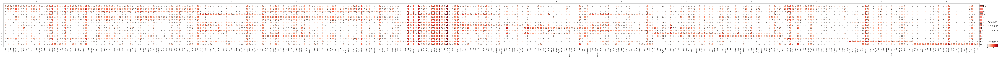

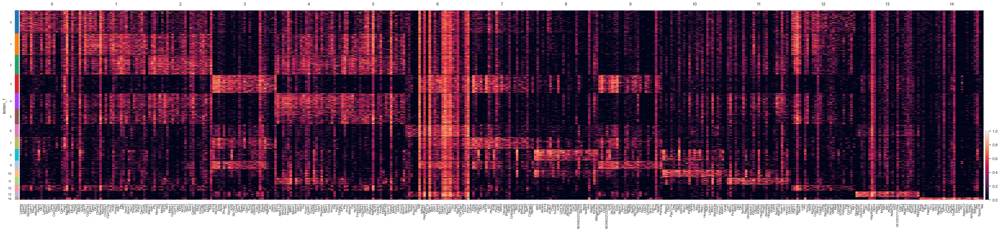

In [124]:
adata.layers["logcounts"] = adata.layers["counts"].log1p()
for resolution in parameters["resolutions"]:
    scp.tl.rank_genes_groups(adata, groupby=f"leiden_{resolution}", method="wilcoxon", layer="logcounts")

    with pd.ExcelWriter(f"tables/{dataset_name}/leiden_{resolution}.xlsx") as writer:
        for cluster in adata.obs[f"leiden_{resolution}"].cat.categories:
            genes = adata.uns["rank_genes_groups"]["names"][f"{cluster}"]
            scores = adata.uns["rank_genes_groups"]["scores"][f"{cluster}"]
            logfoldchanges = adata.uns["rank_genes_groups"]["logfoldchanges"][f"{cluster}"]
            pvals = adata.uns["rank_genes_groups"]["pvals"][f"{cluster}"]
            pvals_adj = adata.uns["rank_genes_groups"]["pvals_adj"][f"{cluster}"]
            df = pd.DataFrame({"gene": genes, "score": scores, "logfoldchange": logfoldchanges, "pval": pvals, "pval_adj": pvals_adj})
            df.to_excel(writer, sheet_name=f"cluster_{cluster}", index=False)

    genes = {}
    for cluster in adata.obs[f"leiden_{resolution}"].cat.categories:
        genes[cluster] = adata.uns["rank_genes_groups"]["names"][f"{cluster}"][:25]

    dp = scp.pl.dotplot(adata,var_names=genes,groupby=f"leiden_{resolution}", return_fig=True)
    dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()
    dp.savefig(f"figures/{dataset_name}/DE_dotplot_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)

    fig, dp = heatmap(adata,var_names=genes,groupby=f"leiden_{resolution}", standard_scale="var", figsize=(50,10), show_gene_labels=True, show=False)
    fig.savefig(f"figures/{dataset_name}/DE_heatmap_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)


# Density by sample

/var/folders/t9/0pk458_94qv27021t99vs5fr0000gn/T/ipykernel_5122/610296816.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_counts = adata.obs.groupby(["sample", f"leiden_{resolution}"]).size().unstack(fill_value=0)
/var/folders/t9/0pk458_94qv27021t99vs5fr0000gn/T/ipykernel_5122/610296816.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_counts = adata.obs.groupby(["sample", f"leiden_{resolution}"]).size().unstack(fill_value=0)
/var/folders/t9/0pk458_94qv27021t99vs5fr0000gn/T/ipykernel_5122/610296816.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to Tr

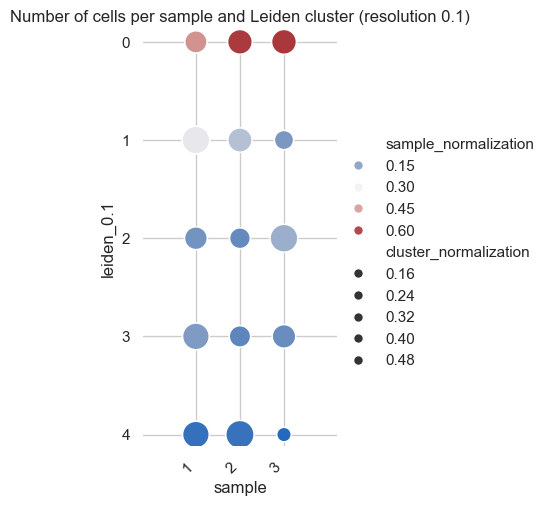

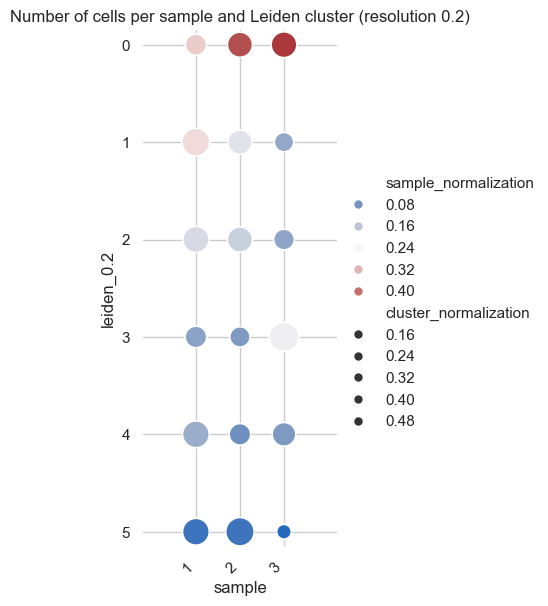

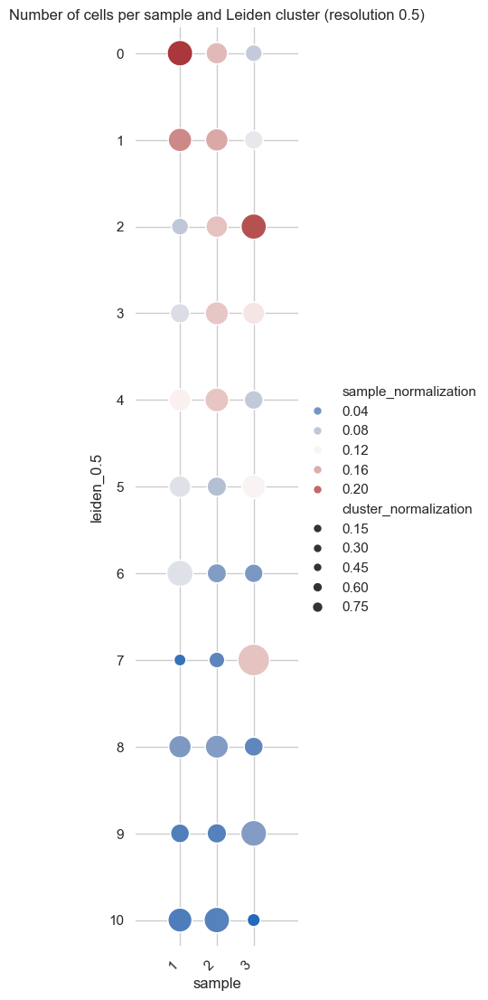

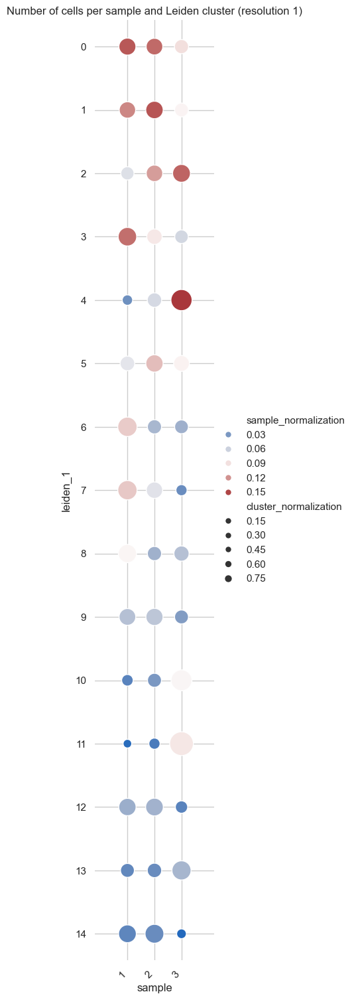

In [125]:
for resolution in parameters["resolutions"]:
    sns.set_theme(style="whitegrid")
    cluster_counts = adata.obs.groupby(["sample", f"leiden_{resolution}"]).size().unstack(fill_value=0)
    shape = cluster_counts.shape
    cluster_counts = cluster_counts.div(cluster_counts.sum(axis=1), axis=0)
    cluster_counts_ = cluster_counts.div(cluster_counts.sum(axis=0), axis=1)
    cluster_counts = cluster_counts.reset_index().melt(id_vars="sample", var_name=f"leiden_{resolution}", value_name="sample_normalization")
    cluster_counts_ = cluster_counts_.reset_index().melt(id_vars="sample", var_name=f"leiden_{resolution}", value_name="cluster_normalization")
    cluster_counts["cluster_normalization"] = cluster_counts_["cluster_normalization"].values
    aspect = shape[0]/shape[1]
    obj = sns.relplot(data=cluster_counts, x="sample", y=f"leiden_{resolution}", 
                      hue="sample_normalization", size="cluster_normalization", 
                      kind="scatter", height=shape[1], aspect=aspect, palette="vlag", 
                      sizes=(50, 800), size_norm=(0, 1))#, hue_norm=(0, 1))
    for legend_handle in obj.legend.legend_handles:
        legend_handle.set_markersize(max(6,legend_handle.get_markersize()*0.3))

    plt.xticks(rotation=45, ha='right')
    plt.title(f"Number of cells per sample and Leiden cluster (resolution {resolution})")
    obj.ax.margins(.6,0.03)
    obj.despine(left=True, bottom=True)
    plt.savefig(f"figures/{dataset_name}/clustermap_leiden_{resolution}.png", bbox_inches="tight", transparent=True, dpi=300)

# Save 

## Adata object

In [126]:
adata.write(f"data_processed/adata_{dataset_name}.h5ad")

## Save analysis script

In [128]:
# Get the current date
current_date = datetime.now().strftime("%Y%m%d")

# Construct the output file name with the current date
input_file = f"analysis_by_condition.ipynb"
output_file = f"script_versions/analysis_by_batch_{dataset[1]}_{current_date}"

# Convert the notebook to HTML with the new file name
!jupyter nbconvert --to html "$input_file" --output "$output_file"


[NbConvertApp] Converting notebook analysis_by_condition.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 37 image(s).
[NbConvertApp] Writing 20430724 bytes to script_versions/analysis_by_batch_wildtype_20250319.html
